## **Classification**
The task of identifying to which category an object belongs to. Applications: Spam detection, Image recognition, Propensity Modeling, Credit Risk , etc

In [3]:
import statsmodels.formula.api as sm
from sklearn.model_selection import train_test_split

from collections import Counter
import numpy as np
from scipy import stats
import pandas as pd
import matplotlib.pyplot as plt

#Models Classification
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBClassifier


#Model Metrics https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.cross_validation import cross_val_score, LeaveOneOut


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


## 4 B  Classification Models

'https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data'

In [4]:
cldf=pd.read_csv('C:\\Users\\ajaohri\\Desktop\\ODSP\\data\\adult.data.txt',header=None)

In [5]:
%pwd

'C:\\Users\\ajaohri'

In [6]:
import sys
print("The memory usage  of dataset is GB",sys.getsizeof(cldf)/(1024**3))

The memory usage  of dataset is GB 0.01968960464000702


In [7]:
os.chdir('C:\\Users\\ajaohri\\Desktop\\ODSP\\data')

In [8]:
os.listdir()

['adult.data.txt',
 'airquality.csv',
 'BigDiamonds.csv',
 'BigDiamonds.csv.zip',
 'BigDiamonds.zip',
 'daily-total-female-births.csv',
 'DecisionTree.png',
 'df3.csv',
 'diamonds.csv',
 'dot_data.txt',
 'fruit_classifier.txt',
 'iris.csv',
 'iris2.csv',
 'iris3.csv',
 'mtcars.csv',
 'plantTraits.csv',
 'R_ Plant Species Traits Data.html',
 'tree.dot',
 'xgb.pkl']

In [9]:
cldf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [10]:
cldf.shape

(32561, 15)

In [11]:
features=["age","workclass","fnlwgt","education","education-num","marital-status","occupation","relationship","race","sex","capital-gain","capital-loss","hours-per-week","native-country","income"]


In [12]:
cldf.columns=features
features=list(features)
features

['age',
 'workclass',
 'fnlwgt',
 'education',
 'education-num',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital-gain',
 'capital-loss',
 'hours-per-week',
 'native-country',
 'income']

In [13]:
del features[14]

In [14]:
features

['age',
 'workclass',
 'fnlwgt',
 'education',
 'education-num',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital-gain',
 'capital-loss',
 'hours-per-week',
 'native-country']

In [15]:
cldf.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [16]:
%whos DataFrame

Variable   Type         Data/Info
---------------------------------
cldf       DataFrame           age          workc<...>[32561 rows x 15 columns]


In [17]:
#find missing values
cldf.apply(lambda x: sum(x.isnull().values), axis = 0) # For columns

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
income            0
dtype: int64

In [18]:
X=features

In [19]:
y='income'

In [20]:
#X.remove(y)

In [21]:
cldf.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [22]:
cldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
age               32561 non-null int64
workclass         32561 non-null object
fnlwgt            32561 non-null int64
education         32561 non-null object
education-num     32561 non-null int64
marital-status    32561 non-null object
occupation        32561 non-null object
relationship      32561 non-null object
race              32561 non-null object
sex               32561 non-null object
capital-gain      32561 non-null int64
capital-loss      32561 non-null int64
hours-per-week    32561 non-null int64
native-country    32561 non-null object
income            32561 non-null object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [23]:
print(" The dataset has ",cldf.shape[0],"rows and ",cldf.shape[1],"columns")

 The dataset has  32561 rows and  15 columns


In [24]:
#categorical columns
CL_CATEGORICAL_COLUMNS=cldf.select_dtypes(exclude=['int', 'float','int64']).columns
CL_CATEGORICAL_COLUMNS

Index(['workclass', 'education', 'marital-status', 'occupation',
       'relationship', 'race', 'sex', 'native-country', 'income'],
      dtype='object')

In [25]:
for i in range(len(CL_CATEGORICAL_COLUMNS)):
    print("Unique Values of ",CL_CATEGORICAL_COLUMNS[i],len(pd.value_counts(cldf[CL_CATEGORICAL_COLUMNS[i]])))

Unique Values of  workclass 9
Unique Values of  education 16
Unique Values of  marital-status 7
Unique Values of  occupation 15
Unique Values of  relationship 6
Unique Values of  race 5
Unique Values of  sex 2
Unique Values of  native-country 42
Unique Values of  income 2


Clearly if number of unique values is small it is categorical data, else it is numerical /string data and  needs to be deleted  from Categoric Data Columns
Here <font color='red'>native-country </font> can be problematic because of the number of distinct categories

In [26]:
for i in range(len(CL_CATEGORICAL_COLUMNS)):
    print(" Value Counts of CATEGORICAL_COLUMNS")
    print("Counts of",CL_CATEGORICAL_COLUMNS[i])
    print(pd.value_counts(cldf[CL_CATEGORICAL_COLUMNS[i]],normalize=True))

 Value Counts of CATEGORICAL_COLUMNS
Counts of workclass
 Private             0.697030
 Self-emp-not-inc    0.078038
 Local-gov           0.064279
 ?                   0.056386
 State-gov           0.039864
 Self-emp-inc        0.034274
 Federal-gov         0.029483
 Without-pay         0.000430
 Never-worked        0.000215
Name: workclass, dtype: float64
 Value Counts of CATEGORICAL_COLUMNS
Counts of education
 HS-grad         0.322502
 Some-college    0.223918
 Bachelors       0.164461
 Masters         0.052916
 Assoc-voc       0.042443
 11th            0.036086
 Assoc-acdm      0.032769
 10th            0.028654
 7th-8th         0.019840
 Prof-school     0.017690
 9th             0.015786
 12th            0.013298
 Doctorate       0.012684
 5th-6th         0.010227
 1st-4th         0.005160
 Preschool       0.001566
Name: education, dtype: float64
 Value Counts of CATEGORICAL_COLUMNS
Counts of marital-status
 Married-civ-spouse       0.459937
 Never-married            0.328092
 Div

- Here non white race is only 15% and non US is only 11%.
- we create new variables manually

In [27]:
#remove white space
cldf.race = [x.strip().replace(' ', '_') for x in cldf.race]


In [28]:

cldf['Race'] = ['White' if x == 'White' else 'Non-White' for x in cldf['race']]


In [29]:
pd.value_counts(cldf.Race)

White        27816
Non-White     4745
Name: Race, dtype: int64

In [30]:
pd.value_counts(cldf.race)

White                 27816
Black                  3124
Asian-Pac-Islander     1039
Amer-Indian-Eskimo      311
Other                   271
Name: race, dtype: int64

In [31]:
pd.value_counts(cldf.Race)

White        27816
Non-White     4745
Name: Race, dtype: int64

In [32]:
#remove white space
cldf['native-country'] = [x.strip().replace(' ', '_') for x in cldf['native-country']]

In [33]:
cldf['Native-Country'] = ['USA' if x == 'United-States' else 'Non-US' for x in cldf['native-country']]


In [34]:
pd.value_counts(cldf['Native-Country'])

USA       29170
Non-US     3391
Name: Native-Country, dtype: int64

In [35]:
pd.value_counts(cldf['native-country'])

United-States                 29170
Mexico                          643
?                               583
Philippines                     198
Germany                         137
Canada                          121
Puerto-Rico                     114
El-Salvador                     106
India                           100
Cuba                             95
England                          90
Jamaica                          81
South                            80
China                            75
Italy                            73
Dominican-Republic               70
Vietnam                          67
Guatemala                        64
Japan                            62
Poland                           60
Columbia                         59
Taiwan                           51
Haiti                            44
Iran                             43
Portugal                         37
Nicaragua                        34
Peru                             31
France                      

In [36]:
del cldf['native-country']
 

In [37]:
del cldf['race']

In [38]:
#categorical columns
CL_CATEGORICAL_COLUMNS=cldf.select_dtypes(exclude=['int', 'float','int64']).columns
CL_CATEGORICAL_COLUMNS

Index(['workclass', 'education', 'marital-status', 'occupation',
       'relationship', 'sex', 'income', 'Race', 'Native-Country'],
      dtype='object')

In [39]:
for i in range(len(CL_CATEGORICAL_COLUMNS)):
    print("Unique Values of ",CL_CATEGORICAL_COLUMNS[i],len(pd.value_counts(cldf[CL_CATEGORICAL_COLUMNS[i]])))

Unique Values of  workclass 9
Unique Values of  education 16
Unique Values of  marital-status 7
Unique Values of  occupation 15
Unique Values of  relationship 6
Unique Values of  sex 2
Unique Values of  income 2
Unique Values of  Race 2
Unique Values of  Native-Country 2


In [40]:
CL_CONTINUOS_COLUMNS=cldf._get_numeric_data().columns


In [41]:
CL_CONTINUOS_COLUMNS

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week'],
      dtype='object')

In [42]:
for i in range(len(CL_CONTINUOS_COLUMNS)):
    print("Unique Values of ",CL_CONTINUOS_COLUMNS[i],len(pd.value_counts(cldf[CL_CONTINUOS_COLUMNS[i]])))

Unique Values of  age 73
Unique Values of  fnlwgt 21648
Unique Values of  education-num 16
Unique Values of  capital-gain 119
Unique Values of  capital-loss 92
Unique Values of  hours-per-week 94


In [43]:
cldf2=cldf.loc[:, cldf.columns != 'income']

In [44]:
cldf2.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,sex,capital-gain,capital-loss,hours-per-week,Race,Native-Country
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,Male,2174,0,40,White,USA
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,Male,0,0,13,White,USA
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,Male,0,0,40,White,USA
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Male,0,0,40,Non-White,USA
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Female,0,0,40,Non-White,Non-US


In [45]:
cldf2=pd.get_dummies(cldf2,drop_first=True)

In [46]:
cldf2.columns

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'workclass_ Federal-gov', 'workclass_ Local-gov',
       'workclass_ Never-worked', 'workclass_ Private',
       'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc',
       'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 11th',
       'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th',
       'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm',
       'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate',
       'education_ HS-grad', 'education_ Masters', 'education_ Preschool',
       'education_ Prof-school', 'education_ Some-college',
       'marital-status_ Married-AF-spouse',
       'marital-status_ Married-civ-spouse',
       'marital-status_ Married-spouse-absent',
       'marital-status_ Never-married', 'marital-status_ Separated',
       'marital-status_ Widowed', 'occupation_ Adm-clerical',
       'occupation_ Armed-Force

In [47]:
cldf3=pd.DataFrame(cldf.income)

In [48]:
cldf4 = pd.concat([cldf2.reset_index(drop=True), cldf3], axis=1)

In [49]:
cldf4.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,...,occupation_ Transport-moving,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,sex_ Male,Race_White,Native-Country_USA,income
0,39,77516,13,2174,0,40,0,0,0,0,...,0,1,0,0,0,0,1,1,1,<=50K
1,50,83311,13,0,0,13,0,0,0,0,...,0,0,0,0,0,0,1,1,1,<=50K
2,38,215646,9,0,0,40,0,0,0,1,...,0,1,0,0,0,0,1,1,1,<=50K
3,53,234721,7,0,0,40,0,0,0,1,...,0,0,0,0,0,0,1,0,1,<=50K
4,28,338409,13,0,0,40,0,0,0,1,...,0,0,0,0,0,1,0,0,0,<=50K


In [50]:
X=cldf4.columns
X

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'workclass_ Federal-gov', 'workclass_ Local-gov',
       'workclass_ Never-worked', 'workclass_ Private',
       'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc',
       'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 11th',
       'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th',
       'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm',
       'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate',
       'education_ HS-grad', 'education_ Masters', 'education_ Preschool',
       'education_ Prof-school', 'education_ Some-college',
       'marital-status_ Married-AF-spouse',
       'marital-status_ Married-civ-spouse',
       'marital-status_ Married-spouse-absent',
       'marital-status_ Never-married', 'marital-status_ Separated',
       'marital-status_ Widowed', 'occupation_ Adm-clerical',
       'occupation_ Armed-Force

In [51]:
y='income'

In [52]:
X=list(X)
X.remove(y)

In [53]:
pd.value_counts(cldf4.income)

 <=50K    24720
 >50K      7841
Name: income, dtype: int64

In [54]:
#remove white space
cldf4['income'] = [x.strip().replace(' ', '_') for x in cldf4['income']]

In [55]:
cldf4['income'] = [1 if x == '>50K' else 0 for x in cldf4['income']]


In [56]:
pd.value_counts(cldf4.income)

0    24720
1     7841
Name: income, dtype: int64

In [57]:
cldf4.columns

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'workclass_ Federal-gov', 'workclass_ Local-gov',
       'workclass_ Never-worked', 'workclass_ Private',
       'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc',
       'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 11th',
       'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th',
       'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm',
       'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate',
       'education_ HS-grad', 'education_ Masters', 'education_ Preschool',
       'education_ Prof-school', 'education_ Some-college',
       'marital-status_ Married-AF-spouse',
       'marital-status_ Married-civ-spouse',
       'marital-status_ Married-spouse-absent',
       'marital-status_ Never-married', 'marital-status_ Separated',
       'marital-status_ Widowed', 'occupation_ Adm-clerical',
       'occupation_ Armed-Force

In [58]:
cldf4[X].head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,...,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,sex_ Male,Race_White,Native-Country_USA
0,39,77516,13,2174,0,40,0,0,0,0,...,0,0,1,0,0,0,0,1,1,1
1,50,83311,13,0,0,13,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1
2,38,215646,9,0,0,40,0,0,0,1,...,0,0,1,0,0,0,0,1,1,1
3,53,234721,7,0,0,40,0,0,0,1,...,0,0,0,0,0,0,0,1,0,1
4,28,338409,13,0,0,40,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0


In [59]:
cldf4[['income']].head()

,income
0,0
1,0
2,0
3,0
4,0


In [60]:

X_train, X_test, y_train, y_test = train_test_split(cldf4[X], cldf4[['income']], test_size=0.3)


We assume stages of Business UnderStanding, Data UnderStanding and  Data Preperation are already done as per the earlier templates which are same for models.

#  4 B 0. 1 Metrics to Evaluate Classification Models

### #  4 B 0. 1 Confusion matrix to evaluate the accuracy of a classification

By definition a confusion matrix C  is such that Cij is equal to the number of observations known to be in group i  but predicted to be in group j .Thus in binary classification, the count of true negatives is C0,0 , false negatives is C1,0 , true positives is C1,1 and false positives is C0,1

### #  4 B 0. 2 Accuracy (ACC) 
(Σ True positive + Σ True negative)/Σ Total population

### #  4 B 0. 3 Classification_report

Build a text report showing the main classification metrics precision, recall, f1-score, support.

 - **Precision** = Σ True positive/Σ Predicted condition positive
 - **Recall, Sensitivity, probability of detection** = Σ True positive/Σ Condition positive
 - **F1 score** =  2/(1/Recall+ 1/Precision)

The **precision** is the ratio tp / (tp + fp) where tp is the number of true positives and fp the number of false positives. The precision is intuitively the ability of the classifier not to label as positive a sample that is negative.

The **recall** is the ratio tp / (tp + fn) where tp is the number of true positives and fn the number of false negatives. The recall is intuitively the ability of the classifier to find all the positive samples.

The **F-beta score** can be interpreted as a weighted harmonic mean of the precision and recall, where an F-beta score reaches its best value at 1 and worst score at 0.

The **F-beta score** weights recall more than precision by a factor of beta. beta == 1.0 means recall and precision are equally important.

The **support** is the number of occurrences of each class in y_true.

### #  4 B 0. 4 **ROC AUC**
ROC- Compute Receiver operating characteristic (ROC). ROC AUC Compute Area Under the Receiver Operating Characteristic Curve **(ROC AUC)** from prediction scores.roc_curve computes the receiver operating characteristic curve, or ROC curve. This function requires the true binary value and the target scores, which can either be probability estimates of the positive class, confidence values, or binary decisions
example -  fpr, tpr, thresholds = roc_curve(y, scores, pos_label=2)

A receiver operating characteristic (ROC), or simply ROC curve, is a graphical plot which illustrates the performance of a binary classifier system as its discrimination threshold is varied. It is created by plotting the fraction of true positives out of the positives (TPR = true positive rate) vs. the fraction of false positives out of the negatives (FPR = false positive rate), at various threshold settings. TPR is also known as sensitivity, and FPR is one minus the specificity or true negative rate


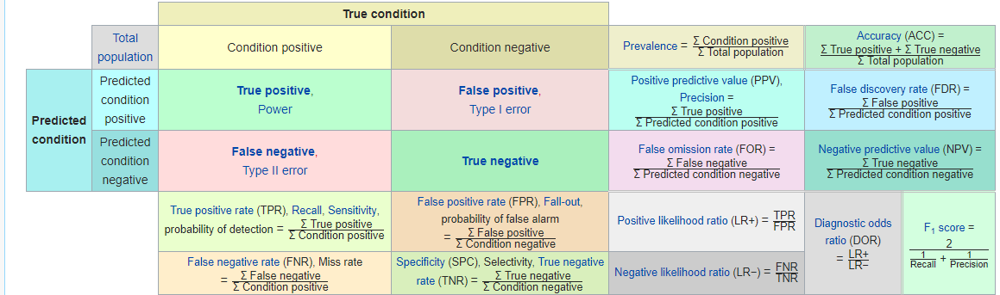

In [61]:
Image("C:\\Users\\ajaohri\\Desktop\\ODSP\\img\\confusion_matrix.png")


## #  4 B 1.0 Logistic Regression
Logistic regression, despite its name, is a linear model for classification rather than regression. Logistic regression is also known as logit regression, maximum-entropy classification (MaxEnt) or the log-linear classifier. In the logistic model, the log-odds (the logarithm of the odds) for the value labeled "1" is a linear combination of one or more independent variables ("predictors"); the independent variables can each be a binary variable (two classes, coded by an indicator variable). The probabilities describing the possible outcomes of a single trial are modeled using a logistic function.  Logistic regression is used to describe data and to explain the relationship between one dependent binary variable and one or more nominal, ordinal, interval or ratio-level independent variable


Example of Logistic Regression

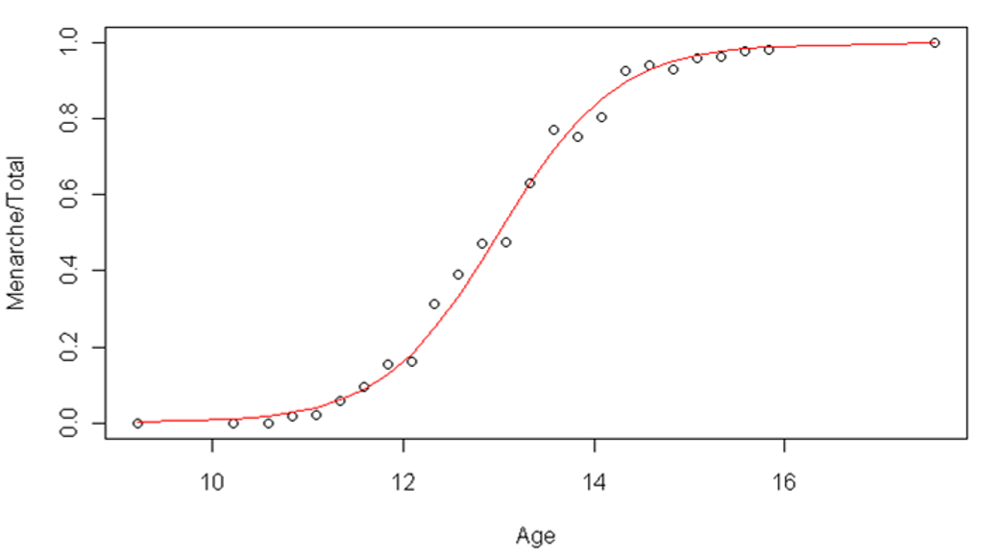

In [62]:
Image('C:\\Users\\ajaohri\\Desktop\\ODSP\\img\\lr.png')

In [63]:

lr = LogisticRegression().fit(X_train, y_train).predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [64]:
print("Accuracy Score for LogisticRegression model is",accuracy_score(y_test,lr))
print("Area Under Curve for LogisticRegression model is",roc_auc_score(y_test,lr))



Accuracy Score for LogisticRegression model is 0.7943494728221927
Area Under Curve for LogisticRegression model is 0.6116117402690616


In [65]:
clf=LogisticRegression().fit(X_train, y_train)
clf.predict(X_test)
clf.score(X_test, y_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.7943494728221927

##  4 B 2.0 Naive Bayes
Naive Bayes methods are a set of supervised learning algorithms based on applying Bayes’ theorem with the “naive” assumption of conditional independence between every pair of features given the value of the class variable. Gaussian Naive Bayes (GaussianNB)
can perform online updates to model parameters via partial_fit method.  (Figure of Bayes Theorem  below)
In spite of their apparently over-simplified assumptions, naive Bayes classifiers have worked quite well in many real-world situations, famously document classification and spam filtering. They require a small amount of training data to estimate the necessary parameters. Naive Bayes learners and classifiers can be extremely fast compared to more sophisticated methods. The decoupling of the class conditional feature distributions means that each distribution can be independently estimated as a one dimensional distribution. This in turn helps to alleviate problems stemming from the curse of dimensionality.

On the flip side, although naive Bayes is known as a decent classifier, it is known to be a bad estimator, so the probability outputs from predict_proba are not to be taken too seriously.

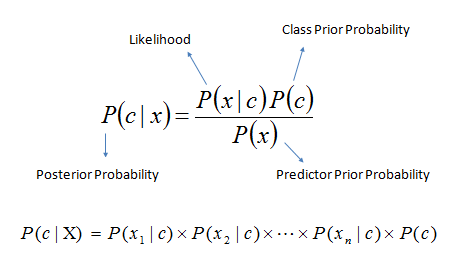

In [66]:
Image('C:\\Users\\ajaohri\\Desktop\\ODSP\\img\\gnb.png')

In [67]:
gnb = GaussianNB().fit(X_train, y_train).predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [68]:
print("Accuracy Score for Naive_Bayes model is",accuracy_score(y_test,gnb))
print("Area Under Curve for Naive_Bayes model is",roc_auc_score(y_test,gnb))

 

Accuracy Score for Naive_Bayes model is 0.7942471081994062
Area Under Curve for Naive_Bayes model is 0.6319818929704659


## 4 B 3.0 Linear Support Vector Classification.
Support vector machines (SVMs) are a set of supervised learning methods used for classification, regression and outliers detection. A Support Vector Machine (SVM) performs classification by finding the hyperplane that maximizes the margin between the two classes. The vectors (cases) that define the hyperplane are the support vectors.

The advantages of support vector machines are:

Effective in high dimensional spaces.
Still effective in cases where number of dimensions is greater than the number of samples.
Uses a subset of training points in the decision function (called support vectors), so it is also memory efficient.
Versatile: different Kernel functions can be specified for the decision function. Common kernels are provided, but it is also possible to specify custom kernels.
The disadvantages of support vector machines include:

If the number of features is much greater than the number of samples, avoid over-fitting in choosing Kernel functions and regularization term is crucial.
SVMs do not directly provide probability estimates, these are calculated using an expensive five-fold cross-validation (see Scores and probabilities, below).


LVC is similar to SVC with parameter kernel=’linear’, but implemented in terms of liblinear rather than libsvm, so it has more flexibility in the choice of penalties and loss functions and should scale better to large numbers of samples.
This class supports both dense and sparse input and the multiclass support is handled according to a one-vs-the-rest scheme.

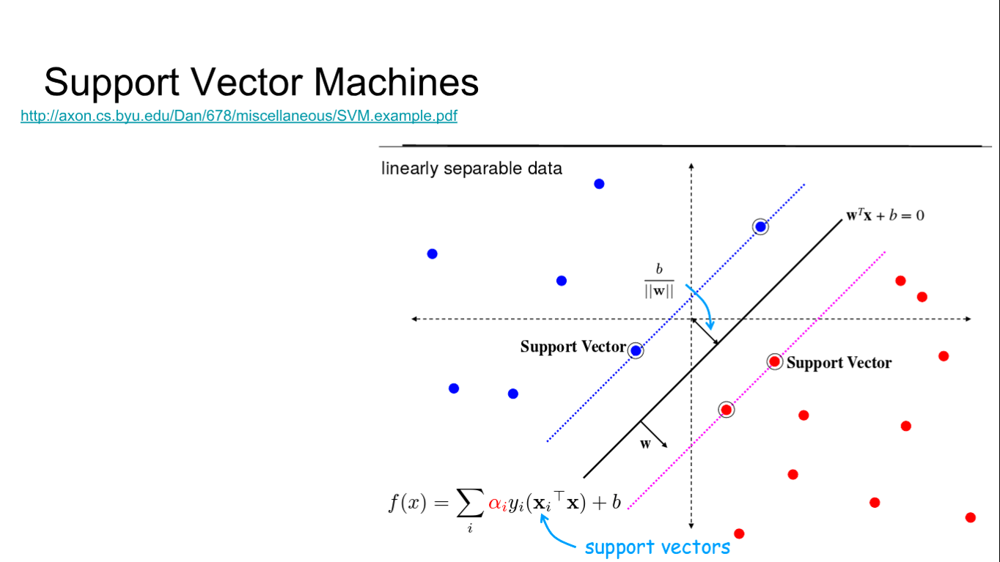

In [69]:
Image('C:\\Users\\ajaohri\\Desktop\\ODSP\\img\\svm.png')

In [70]:
svc = LinearSVC(C=1.0).fit(X_train, y_train).predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [71]:
print("Accuracy Score for SVC model is",accuracy_score(y_test,svc))
print("Area Under Curve for SVC model is",roc_auc_score(y_test,svc))

Accuracy Score for SVC model is 0.7743883713788514
Area Under Curve for SVC model is 0.5400744371080539


## 4 B 4.0 Random Forest
A random forest classifier.

A random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting. The sub-sample size is always the same as the original input sample size but the samples are drawn with replacement if bootstrap=True. In random forests (see RandomForestClassifier and RandomForestRegressor classes), each tree in the ensemble is built from a sample drawn with replacement (i.e., a bootstrap sample) from the training set. In addition, when splitting a node during the construction of the tree, the split that is chosen is no longer the best split among all features. Instead, the split that is picked is the best split among a random subset of the features. As a result of this randomness, the bias of the forest usually slightly increases (with respect to the bias of a single non-random tree) but, due to averaging, its variance also decreases, usually more than compensating for the increase in bias, hence yielding an overall better model.

The scikit-learn implementation combines classifiers by averaging their probabilistic prediction, instead of letting each classifier vote for a single class.

In [72]:
rfc = RandomForestClassifier(n_estimators=1).fit(X_train, y_train).predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


In [73]:
   
print("Accuracy Score for Random Forest model is",accuracy_score(y_test,rfc))
print("Area Under Curve for Random Forest model is",roc_auc_score(y_test,rfc))

Accuracy Score for Random Forest model is 0.7999795270754427
Area Under Curve for Random Forest model is 0.7329956719838463


### 4 B 4.1 Using Random Forests for Feature Importance


In [74]:
## Import the random forest model.
from sklearn.ensemble import RandomForestClassifier 
## This line instantiates the model. 
rf = RandomForestClassifier() 
## Fit the model on your training data.
rf.fit(X_train, y_train) 
## And score it on your testing data.
rf.score(X_test, y_test)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


0.8462483365748797

In [75]:
import pandas as pd
feature_importances = pd.DataFrame(rf.feature_importances_,index = X_train.columns,columns=['importance']).sort_values('importance',ascending=False)

In [76]:
feature_importances.head(10)

,importance
fnlwgt,0.161273
age,0.150342
capital-gain,0.111162
marital-status_ Married-civ-spouse,0.086094
hours-per-week,0.084870
education-num,0.077013
marital-status_ Never-married,0.039180
capital-loss,0.032905
occupation_ Exec-managerial,0.017114
sex_ Male,0.015680


## 4 B 5.0  K Nearest Neighbour
The principle behind nearest neighbor methods is to find a predefined number of training samples closest in distance to the new point, and predict the label from these. The number of samples can be a user-defined constant (k-nearest neighbor learning), or vary based on the local density of points (radius-based neighbor learning). The distance can, in general, be any metric measure: standard Euclidean distance is the most common choice. Neighbors-based methods are known as non-generalizing machine learning methods, since they simply “remember” all of its training data (possibly transformed into a fast indexing structure such as a Ball Tree or KD Tree).

Despite its simplicity, nearest neighbors has been successful in a large number of classification and regression problems, including handwritten digits and satellite image scenes. Being a non-parametric method, it is often successful in classification situations where the decision boundary is very irregular.

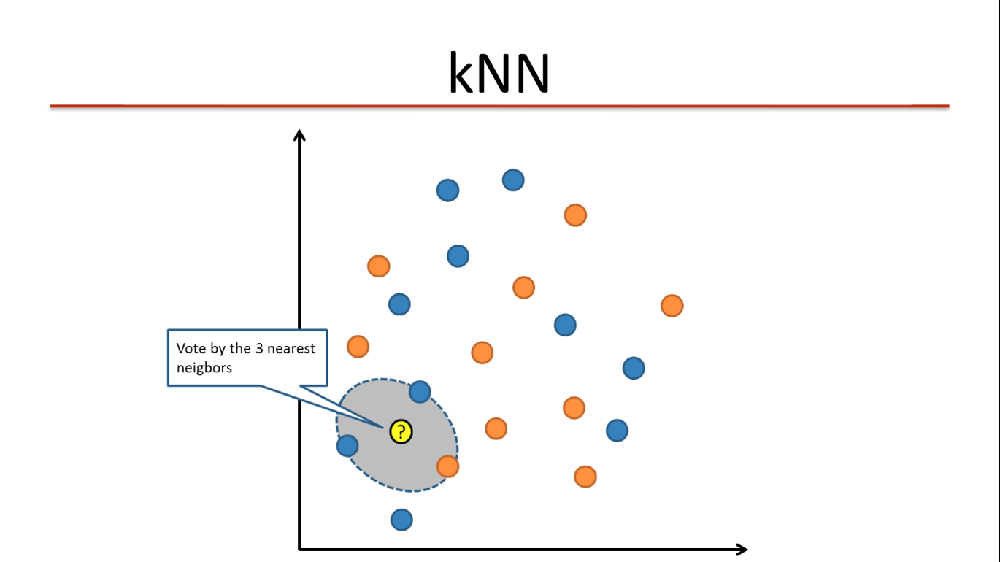

In [77]:
Image('C:\\Users\\ajaohri\\Desktop\\ODSP\\img\\knn.png')

In [78]:
classifier= KNeighborsClassifier(n_neighbors=3).fit(X_train, y_train).predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  """Entry point for launching an IPython kernel.


In [79]:
print("Accuracy Score for KNeighbors Classifier model is",accuracy_score(y_test,classifier))
print("Area Under Curve for KNeighbors Classifier model is",roc_auc_score(y_test,classifier))

Accuracy Score for KNeighbors Classifier model is 0.7541201760671512
Area Under Curve for KNeighbors Classifier model is 0.6223276402488467


## 4 B 6.0 Decision Tree
Decision Trees (DTs) are a non-parametric supervised learning method used for classification and regression. The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features.
For instance, in the example below, decision trees learn from data to approximate a sine curve with a set of if-then-else decision rules. The deeper the tree, the more complex the decision rules and the fitter the model.

Some advantages of decision trees are:

Simple to understand and to interpret. Trees can be visualised.
Requires little data preparation. Other techniques often require data normalisation, dummy variables need to be created and blank values to be removed. Note however that this module does not support missing values.
The cost of using the tree (i.e., predicting data) is logarithmic in the number of data points used to train the tree.
Able to handle both numerical and categorical data. Other techniques are usually specialised in analysing datasets that have only one type of variable. See algorithms for more information.
Able to handle multi-output problems.
Uses a white box model. If a given situation is observable in a model, the explanation for the condition is easily explained by boolean logic. By contrast, in a black box model (e.g., in an artificial neural network), results may be more difficult to interpret.
Possible to validate a model using statistical tests. That makes it possible to account for the reliability of the model.
Performs well even if its assumptions are somewhat violated by the true model from which the data were generated.
The disadvantages of decision trees include:

Decision-tree learners can create over-complex trees that do not generalise the data well. This is called overfitting. Mechanisms such as pruning (not currently supported), setting the minimum number of samples required at a leaf node or setting the maximum depth of the tree are necessary to avoid this problem.
Decision trees can be unstable because small variations in the data might result in a completely different tree being generated. This problem is mitigated by using decision trees within an ensemble.
The problem of learning an optimal decision tree is known to be NP-complete under several aspects of optimality and even for simple concepts. Consequently, practical decision-tree learning algorithms are based on heuristic algorithms such as the greedy algorithm where locally optimal decisions are made at each node. Such algorithms cannot guarantee to return the globally optimal decision tree. This can be mitigated by training multiple trees in an ensemble learner, where the features and samples are randomly sampled with replacement.
There are concepts that are hard to learn because decision trees do not express them easily, such as XOR, parity or multiplexer problems.
Decision tree learners create biased trees if some classes dominate. It is therefore recommended to balance the dataset prior to fitting with the decision tree.

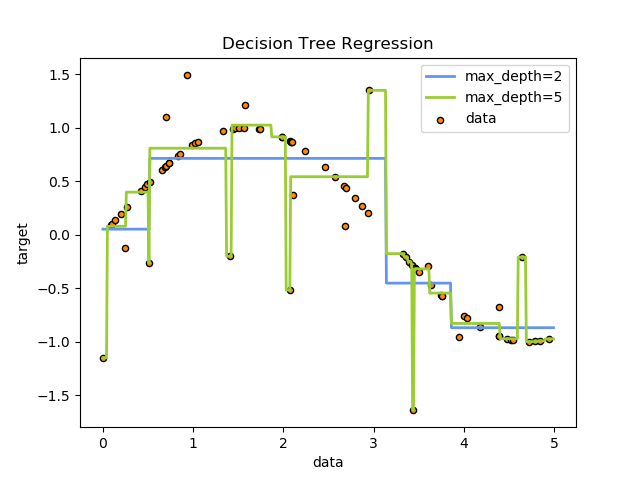

In [80]:
Image('C:\\Users\\ajaohri\\Desktop\\ODSP\\img\\dt.png')

In [81]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier().fit(X_train, y_train).predict(X_test)

In [82]:
print("Accuracy Score for Decision Tree Classifier  model is",accuracy_score(y_test,dt))
print("Area Under Curve for Decision Tree Classifier model is",roc_auc_score(y_test,dt))

Accuracy Score for Decision Tree Classifier  model is 0.8077592384072064
Area Under Curve for Decision Tree Classifier model is 0.7411224563961742


In [83]:
!pip install pydotplus

You are using pip version 18.0, however version 18.1 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [84]:
import pydotplus as pydot

from IPython.display import Image

from sklearn.externals.six import StringIO

In [85]:
import graphviz 


In [86]:
y

'income'

In [87]:
X

['age',
 'fnlwgt',
 'education-num',
 'capital-gain',
 'capital-loss',
 'hours-per-week',
 'workclass_ Federal-gov',
 'workclass_ Local-gov',
 'workclass_ Never-worked',
 'workclass_ Private',
 'workclass_ Self-emp-inc',
 'workclass_ Self-emp-not-inc',
 'workclass_ State-gov',
 'workclass_ Without-pay',
 'education_ 11th',
 'education_ 12th',
 'education_ 1st-4th',
 'education_ 5th-6th',
 'education_ 7th-8th',
 'education_ 9th',
 'education_ Assoc-acdm',
 'education_ Assoc-voc',
 'education_ Bachelors',
 'education_ Doctorate',
 'education_ HS-grad',
 'education_ Masters',
 'education_ Preschool',
 'education_ Prof-school',
 'education_ Some-college',
 'marital-status_ Married-AF-spouse',
 'marital-status_ Married-civ-spouse',
 'marital-status_ Married-spouse-absent',
 'marital-status_ Never-married',
 'marital-status_ Separated',
 'marital-status_ Widowed',
 'occupation_ Adm-clerical',
 'occupation_ Armed-Forces',
 'occupation_ Craft-repair',
 'occupation_ Exec-managerial',
 'occupati

In [88]:
X_train.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,...,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,sex_ Male,Race_White,Native-Country_USA
8163,31,206046,9,0,0,40,0,0,0,1,...,0,0,1,0,0,0,0,1,1,1
14895,35,205584,3,0,0,40,1,0,0,0,...,0,0,1,0,0,0,0,1,1,0
24665,37,196529,14,0,0,45,0,1,0,0,...,0,0,0,0,0,0,1,0,1,1
32179,58,250206,6,5178,0,40,0,0,0,1,...,0,0,0,0,0,0,0,1,1,1
7697,53,290640,4,0,0,40,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0


In [89]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22792 entries, 8163 to 23480
Data columns (total 57 columns):
age                                      22792 non-null int64
fnlwgt                                   22792 non-null int64
education-num                            22792 non-null int64
capital-gain                             22792 non-null int64
capital-loss                             22792 non-null int64
hours-per-week                           22792 non-null int64
workclass_ Federal-gov                   22792 non-null uint8
workclass_ Local-gov                     22792 non-null uint8
workclass_ Never-worked                  22792 non-null uint8
workclass_ Private                       22792 non-null uint8
workclass_ Self-emp-inc                  22792 non-null uint8
workclass_ Self-emp-not-inc              22792 non-null uint8
workclass_ State-gov                     22792 non-null uint8
workclass_ Without-pay                   22792 non-null uint8
education_ 11th     

In [90]:
with open("dot_data.txt", "w") as dot_data:
        dot_data = tree.export_graphviz(tree.DecisionTreeRegressor().fit(X_train, y_train), out_file=dot_data, 
                         feature_names=X,  
                         class_names=y,  
                         filled=True, rounded=True,  
                         special_characters=True) 
        
#visualize output at graphviz web portal address: http://webgraphviz.com or using dot file

In [91]:
%pwd

'C:\\Users\\ajaohri\\Desktop\\ODSP\\data'

In [92]:
dot_data = tree.export_graphviz(tree.DecisionTreeRegressor().fit(X_train, y_train), out_file=None, 
                         feature_names=X,  
                         class_names=y,  
                         filled=True, rounded=True,  
                         special_characters=True)
graph = graphviz.Source(dot_data)  
graph

## 4 B 7.0 XGB Classifier
XGBoost stands for “Extreme Gradient Boosting”, where the term “Gradient Boosting” originates from the paper Greedy Function Approximation: A Gradient Boosting Machine, by Friedman. 


In [93]:
xgb = XGBClassifier().fit(X_train, y_train).predict(X_test)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:95: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:128: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


In [94]:
print("Accuracy Score for XG Boost  model is",accuracy_score(y_test,xgb))
print("Area Under Curve for XG Boost  model is",roc_auc_score(y_test,xgb))

Accuracy Score for XG Boost  model is 0.8618077592384072
Area Under Curve for XG Boost  model is 0.7699208839555638


In [95]:
print("                                    Accuracy Score")
print("LogisticRegression model           ",accuracy_score(y_test,lr))
print("Naive_Bayes model                  ",accuracy_score(y_test,gnb))
print("SVC model                           ",accuracy_score(y_test,svc))
print("Random Forest model                 ",accuracy_score(y_test,rfc))
print("KNeighbors Classifier model         ",accuracy_score(y_test,classifier))
print("Decision Tree Classifier  model     ",accuracy_score(y_test,dt))
print("XG Boost  model                     ",accuracy_score(y_test,xgb))

                                    Accuracy Score
LogisticRegression model            0.7943494728221927
Naive_Bayes model                   0.7942471081994062
SVC model                            0.7743883713788514
Random Forest model                  0.7999795270754427
KNeighbors Classifier model          0.7541201760671512
Decision Tree Classifier  model      0.8077592384072064
XG Boost  model                      0.8618077592384072


In [96]:
print("                                  Area Under Curve")
print(" LogisticRegression model         ",roc_auc_score(y_test,lr))
print(" Naive_Bayes model                ",roc_auc_score(y_test,gnb))
print(" SVC model                        ",roc_auc_score(y_test,svc))
print(" Random Forest model              ",roc_auc_score(y_test,rfc))
print(" KNeighbors Classifier model      ",roc_auc_score(y_test,classifier))
print(" Decision Tree Classifier model   ",roc_auc_score(y_test,dt))
print(" XG Boost  model                  ",roc_auc_score(y_test,xgb))

                                  Area Under Curve
 LogisticRegression model          0.6116117402690616
 Naive_Bayes model                 0.6319818929704659
 SVC model                         0.5400744371080539
 Random Forest model               0.7329956719838463
 KNeighbors Classifier model       0.6223276402488467
 Decision Tree Classifier model    0.7411224563961742
 XG Boost  model                   0.7699208839555638


In [97]:
plt.figure()

# Add the models to the list that you want to view on the ROC plot
models = [
{
    'label': 'Logistic Regression',
    'model': LogisticRegression(),
},
{
    'label': 'GaussianNB',
    'model': GaussianNB(),
},

{
    'label': 'RandomForestClassifier',
    'model': RandomForestClassifier(),
},
{
    'label': 'KNeighborsClassifier',
    'model': KNeighborsClassifier(),
},
{
    'label': 'XGBoost',
    'model': XGBClassifier(),
}
    ,
#{ According to sklearn documentation , the method 'predict_proba' is not defined for 'LinearSVC'
#    'label': 'LinearSVC(C=1.0)',
#    'model': LinearSVC(C=1.0),
#}
#  ,
{
    'label': 'DecisionTreeClassifier()',
    'model': DecisionTreeClassifier(),
}
]

<Figure size 432x288 with 0 Axes>

In [98]:
fig_size = plt.rcParams["figure.figsize"] 
print(fig_size)

[6.0, 4.0]


In [99]:
fig_size[0] = 15
fig_size[1] = 10
plt.rcParams["figure.figsize"] = fig_size

In [100]:
fig = plt.figure()
fig.patch.set_facecolor('xkcd:grey')


<Figure size 1080x720 with 0 Axes>

In [101]:
import sklearn.metrics

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  import sys
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import s

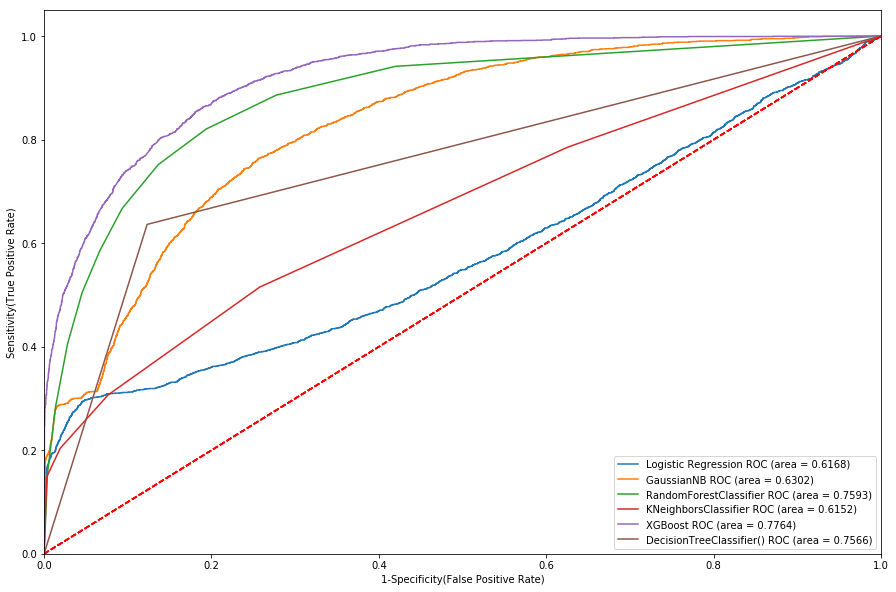

In [102]:
# Below for loop iterates through your models list


x_train, x_test, y_train, y_test = train_test_split(cldf4[X], cldf4[['income']], test_size=0.3)
for m in models:
    model = m['model'] # select the model
    model.fit(x_train, y_train) # train the model
    y_pred=model.predict(x_test) # predict the test data
    #accuracy_score=accuracy_score(y_test,y_pred)
    #print(accuracy_score,"model",model)
    # Compute False postive rate, and True positive rate
    fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_test, model.predict_proba(x_test)[:,1])
    # Calculate Area under the curve to display on the plot
    auc = sklearn.metrics.roc_auc_score(y_test,model.predict(x_test))
    # Now, plot the computed values
    plt.plot(fpr, tpr, label='%s ROC (area = %0.4f)' % (m['label'], auc))
    #plt.plot(label= (m['label'], accuracy_score))

    # Custom settings for the plot 

    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('1-Specificity(False Positive Rate)')
    plt.ylabel('Sensitivity(True Positive Rate)')
#    plt.title('Receiver Operating Characteristic for (State= %0.1f))'%x)
    plt.legend(loc="lower right")
plt.show()   # Display

# Ensemble Models

The   most popular methods for combining the predictions from different models are:

Bagging. Building multiple models (typically of the same type) from different subsamples of the training dataset.
-     Bagged Decision Trees
-     Random Forest
-     Extra Trees

Boosting. Building multiple models (typically of the same type) each of which learns to fix the prediction errors of a prior model in the chain.
- Adaboost
- Stochastic Gradient Boosting

Voting. Building multiple models (typically of differing types) and simple statistics (like calculating the mean) are used to combine predictions.


In [103]:
from sklearn.ensemble import VotingClassifier
from sklearn import model_selection

In [104]:
cldf4[X].head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,...,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,sex_ Male,Race_White,Native-Country_USA
0,39,77516,13,2174,0,40,0,0,0,0,...,0,0,1,0,0,0,0,1,1,1
1,50,83311,13,0,0,13,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1
2,38,215646,9,0,0,40,0,0,0,1,...,0,0,1,0,0,0,0,1,1,1
3,53,234721,7,0,0,40,0,0,0,1,...,0,0,0,0,0,0,0,1,0,1
4,28,338409,13,0,0,40,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0


In [105]:
seed = 7
kfold = model_selection.KFold(n_splits=10, random_state=seed)

In [106]:
import warnings
warnings.filterwarnings("ignore")

In [107]:
#create the  models
estimators = []
model1 = XGBClassifier()
estimators.append(('xgb', model1))
model2 = DecisionTreeClassifier()
estimators.append(('Decision Tree', model2))
model3 = RandomForestClassifier()
estimators.append(('Random Fores', model3))
model4 = GaussianNB()
estimators.append(('Gauessian', model4))
model5 = LogisticRegression()
estimators.append(('Logit', model5))
model6 = KNeighborsClassifier()
estimators.append(('kNN', model6))
# create the ensemble model
ensemble = VotingClassifier(estimators,voting='soft')

In [108]:
results = model_selection.cross_val_score(ensemble, cldf4[X].values, cldf4[['income']].values, cv=kfold)
print(results.mean())

0.8368910300173733


In [109]:
auc=model_selection.cross_val_score(ensemble, cldf4[X].values, cldf4[['income']].values, cv=kfold, scoring='roc_auc')
print(auc.mean())

0.8813905091969307


In [110]:
print("Accuracy Score for Ensemble  model is",results.mean())
print("Area Under Curve for Ensemble  model is", auc.mean())

Accuracy Score for Ensemble  model is 0.8368910300173733
Area Under Curve for Ensemble  model is 0.8813905091969307


# HYPER PARAMETER TUNING

In [ ]:
from sklearn.model_selection import GridSearchCV

In [114]:
sorted(ensemble.get_params().keys())

['Decision Tree',
 'Decision Tree__class_weight',
 'Decision Tree__criterion',
 'Decision Tree__max_depth',
 'Decision Tree__max_features',
 'Decision Tree__max_leaf_nodes',
 'Decision Tree__min_impurity_decrease',
 'Decision Tree__min_impurity_split',
 'Decision Tree__min_samples_leaf',
 'Decision Tree__min_samples_split',
 'Decision Tree__min_weight_fraction_leaf',
 'Decision Tree__presort',
 'Decision Tree__random_state',
 'Decision Tree__splitter',
 'Gauessian',
 'Gauessian__priors',
 'Logit',
 'Logit__C',
 'Logit__class_weight',
 'Logit__dual',
 'Logit__fit_intercept',
 'Logit__intercept_scaling',
 'Logit__max_iter',
 'Logit__multi_class',
 'Logit__n_jobs',
 'Logit__penalty',
 'Logit__random_state',
 'Logit__solver',
 'Logit__tol',
 'Logit__verbose',
 'Logit__warm_start',
 'Random Fores',
 'Random Fores__bootstrap',
 'Random Fores__class_weight',
 'Random Fores__criterion',
 'Random Fores__max_depth',
 'Random Fores__max_features',
 'Random Fores__max_leaf_nodes',
 'Random Fores__

In [124]:
params = {'xgb__learning_rate': [1.0, 100.0], 'Random Fores__n_estimators': [20, 200]}

grid = GridSearchCV(estimator=ensemble, param_grid=params, cv=5)
grid = grid.fit(X_train, y_train)

In [119]:
grid

GridSearchCV(cv=5, error_score='raise',
       estimator=VotingClassifier(estimators=[('xgb', XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objectiv...       weights='uniform'))],
         flatten_transform=None, n_jobs=1, voting='soft', weights=None),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'xgb__learning_rate': [1.0, 100.0], 'Random Fores__n_estimators': [20, 200]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [125]:
y_pred = grid.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [126]:
accuracy_score(y_test,y_pred)

0.7563721977684512

In [127]:
roc_auc_score(y_test,y_pred)


0.5000073111900808

## DUMP MODELS TO PICKLE
Pickle is a Python libraries which is the best choice to perform the task like
- Pickling  the process converting any Python object into a stream of bytes by following the hierarchy of the object we are trying to convert. 
- Unpickling the process of converting the pickled (stream of bytes) back into to the original Python object by following the object hierarchy

In [ ]:
%pwd

In [ ]:
import pickle


In [ ]:
xgb = XGBClassifier().fit(X_train, y_train) 


In [ ]:
xgb

In [ ]:
# Dump the trained xg boost classifier with Pickle
xgboost_pkl_filename = 'xgb.pkl'
# Open the file to save as pkl file
xgboost_model_pkl = open(xgboost_pkl_filename, 'wb')
pickle.dump(xgb, xgboost_model_pkl)
# Close the pickle instances
xgboost_model_pkl.close()
#pickle.dump(xgb, open('xgb.pkl', 'wb'))
#open('xgb.pkl', 'wb').close()

In [ ]:
# Loading the saved decision tree model pickle
xgboost_pkl_filename = 'xgb.pkl'
xgboost_model_pkl = open(xgboost_pkl_filename, 'rb')
xgb_model = pickle.load(xgboost_model_pkl)
print("Loaded XG Boost model :: ", xgb_model)

In [ ]:
xgb_model.predict(X_test)


In [ ]:
with open("xgb.pkl", "rb") as file_handler:
    loaded_pickle = pickle.load(file_handler)
    
loaded_pickle

In [ ]:
from sklearn.externals import joblib

In [ ]:
from joblib import dump, load

In [ ]:
joblib.dump(xgb, "xgb.pkl")

#from sklearn.pipeline import make_pipeline
## TO DOS

#pipe = make_pipeline(PreProcessing(),
                    RandomForestClassifier())
    
##### from joblib import dump, load
#>>> dump(clf, 'filename.joblib')

In [ ]:
from flask import Flask

In [ ]:
app = Flask(__name__)


@app.route("/")
def hello():
    return "Hello World!"


if __name__ == '__main__':
    app.run(debug=True)

In [ ]:
%tb